In [1]:
!!pip install kaggle

['Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/',
 'Requirement already satisfied: kaggle in /usr/local/lib/python3.7/dist-packages (1.5.12)',
 'Requirement already satisfied: six>=1.10 in /usr/local/lib/python3.7/dist-packages (from kaggle) (1.15.0)',
 'Requirement already satisfied: tqdm in /usr/local/lib/python3.7/dist-packages (from kaggle) (4.64.0)',
 'Requirement already satisfied: urllib3 in /usr/local/lib/python3.7/dist-packages (from kaggle) (1.24.3)',
 'Requirement already satisfied: python-slugify in /usr/local/lib/python3.7/dist-packages (from kaggle) (6.1.2)',
 'Requirement already satisfied: python-dateutil in /usr/local/lib/python3.7/dist-packages (from kaggle) (2.8.2)',
 'Requirement already satisfied: requests in /usr/local/lib/python3.7/dist-packages (from kaggle) (2.23.0)',
 'Requirement already satisfied: certifi in /usr/local/lib/python3.7/dist-packages (from kaggle) (2022.6.15)',
 'Requirement already satisfied:

In [2]:
import os
os.mkdir('dataset')

In [3]:
import os
os.environ['KAGGLE_CONFIG_DIR']='/content/dataset'

In [4]:
!kaggle datasets download -d ozanozturk61/istanbul-road-dataset

100% 5.30G/5.32G [00:36<00:00, 191MB/s]
100% 5.32G/5.32G [00:36<00:00, 157MB/s]


In [5]:
!unzip '/content/istanbul-road-dataset.zip' -d '/content/dataset'

Görüntülenen çıkış son 5000 satıra kısaltıldı.
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3812.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3813.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3815.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3816.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3817.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3818.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/382.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3821.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3824.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/3825.png  
  inflating: /content/dataset/Istanbul_Road_Dataset_Zo

In [ ]:
!pip install "opencv-python-headless<4.3"

In [6]:
!pip install -U segmentation-models-pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 3.8 MB/s 
     |████████████████████████████████| 58 kB 6.8 MB/s 
     |████████████████████████████████| 376 kB 31.7 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12421 sha256=78ffab03cbf7a7d1d2d169d56b2e05c054c58959e7eaacb85838c1c50925fc25
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=166253484304d355c6fe5a5dd1faf718abb797296d9d9fc2d7778865ee4c0abe
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels


In [7]:
!pip install --force-reinstall albumentations==1.0.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 98 kB 3.4 MB/s 
     |████████████████████████████████| 596 kB 28.7 MB/s 
     |████████████████████████████████| 38.1 MB 255 kB/s 
     |████████████████████████████████| 15.7 MB 55.8 MB/s 
     |████████████████████████████████| 48.3 MB 1.2 MB/s 
     |████████████████████████████████| 13.5 MB 52.7 MB/s 
     |████████████████████████████████| 1.9 MB 38.4 MB/s 
     |████████████████████████████████| 3.1 MB 56.8 MB/s 
     |████████████████████████████████| 40 kB 6.0 MB/s 
     |████████████████████████████████| 178 kB 65.7 MB/s 
     |████████████████████████████████| 3.4 MB 35.6 MB/s 
     |████████████████████████████████| 6.4 MB 42.1 MB/s 
     |████████████████████████████████| 98 kB 125 kB/s 
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyp

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import os
import glob
import cv2
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from albumentations import HorizontalFlip, VerticalFlip, Rotate
import tqdm
import torch.nn.functional as F
import matplotlib.image as mpimg

import albumentations as album


In [3]:
class RoadDataset(Dataset):
  
    def __init__(self, images_dir, masks_dir, augmentation=None, preprocessing=None):

        

        self.images_dir = images_dir
        self.masks_dir = masks_dir

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):

        image = cv2.imread(self.images_dir [i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = np.array(image)
        mask = cv2.imread(self.masks_dir[i], 0)
        masks = [(mask == 255)]
        mask = np.stack(masks, axis=-1).astype('float')
        
        if self.augmentation:  
            aug=self.augmentation(image=image, mask=mask)
            image, mask = aug['image'], aug['mask']

        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask


    def __len__(self):
       return len(self.images_dir)

In [4]:
import glob
X = sorted(glob.glob('/content/dataset/Istanbul_Road_Dataset_ZoomLevel_15/15/image/*'))
y = sorted(glob.glob('/content/dataset/Istanbul_Road_Dataset_ZoomLevel_15/15/label_1bit/*'))

train_X=X[:8000]
train_y=y[:8000]

valid_X = X[8000:]
valid_y = y[8000:]



In [23]:

import albumentations as album
def get_train_aug():

    train_transform = [
        album.HorizontalFlip(p=0.5),
        album.RandomCrop(height=256, width=256, always_apply=True)
    ]
    return album.Compose(train_transform)


def get_val_aug():

    val_transform = [album.Resize(256, 256, always_apply=True)
        
    ]
    return album.Compose(val_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):

    transform_  = [
        album.Lambda(image=preprocessing_fn),
        album.Lambda(image=to_tensor, mask=to_tensor)
    ]
    return album.Compose(transform_)

In [6]:
import segmentation_models_pytorch as smp 
ENCODER = 'efficientnet-b5'
ENCODER_WEIGHTS = 'imagenet'
DEVICE = 'cuda'

model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=1, 
    activation='sigmoid',
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b5-b6417697.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b5-b6417697.pth


  0%|          | 0.00/117M [00:00<?, ?B/s]

In [11]:
train_dataset=RoadDataset(train_X , train_y , augmentation=get_train_aug(), preprocessing=get_preprocessing(preprocessing_fn))
valid_dataset=RoadDataset(valid_X , valid_y ,augmentation=get_val_aug(), preprocessing=get_preprocessing(preprocessing_fn))

In [8]:
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=2, shuffle=True, num_workers=4)


In [9]:
loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
    smp.utils.metrics.Accuracy(),
    smp.utils.metrics.Precision(),
    smp.utils.metrics.Recall()
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [10]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [ ]:

import torch, gc
import os
gc.collect()
torch.cuda.empty_cache()

max_score = 0

for i in range(10):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, '/content/best_model.pth')
        
    if i == 8 :
        optimizer.param_groups[0]['lr'] = 1e-5


Epoch: 0
valid: 100%|██████████| 1000/1000 [06:47<00:00,  2.46it/s, dice_loss - 0.4086, iou_score - 0.4531, accuracy - 0.9919, precision - 0.5548, recall - 0.7112]

Epoch: 1
valid: 100%|██████████| 1000/1000 [06:46<00:00,  2.46it/s, dice_loss - 0.7033, iou_score - 0.2401, accuracy - 0.979, precision - 0.2689, recall - 0.6957]

Epoch: 2
valid: 100%|██████████| 1000/1000 [06:47<00:00,  2.46it/s, dice_loss - 0.4993, iou_score - 0.4338, accuracy - 0.991, precision - 0.518, recall - 0.7272]

Epoch: 3
valid: 100%|██████████| 1000/1000 [06:46<00:00,  2.46it/s, dice_loss - 0.7218, iou_score - 0.3848, accuracy - 0.9892, precision - 0.4613, recall - 0.7015]

Epoch: 4
valid: 100%|██████████| 1000/1000 [06:46<00:00,  2.46it/s, dice_loss - 0.4562, iou_score - 0.4548, accuracy - 0.9923, precision - 0.5793, recall - 0.6781]

Epoch: 5
valid: 100%|██████████| 1000/1000 [06:46<00:00,  2.46it/s, dice_loss - 0.4, iou_score - 0.4619, accuracy - 0.9923, precision - 0.5741, recall - 0.7012]

Epoch: 6
valid:

In [15]:
if os.path.exists('/content/best_model.pth'):
    best_model = torch.load('/content/best_model.pth', map_location=DEVICE)
    print('Model eklendi')

elif os.path.exists('/content/best_model.pth'):
    best_model = torch.load('/content/best_model.pth', map_location=DEVICE)
    print('Model eklendi.')

Loaded UNet model from this run.


In [80]:
test_image=sorted(glob.glob('/content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/image/*'))
test_label=sorted(glob.glob('/content/dataset/Istanbul_Road_Dataset_ZoomLevel_17/17/label_1bit/*'))

In [81]:
test_img=test_image[:40]
test_lbl=test_label[:40]

In [82]:
test_dataset=RoadDataset(test_img , test_lbl , augmentation=get_val_aug(), preprocessing=get_preprocessing(preprocessing_fn))
test_loader=DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=4)

test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_loader)



valid: 100%|██████████| 20/20 [00:01<00:00, 13.70it/s, dice_loss - 0.4327, iou_score - 0.4008, accuracy - 0.824, precision - 0.5984, recall - 0.5454]


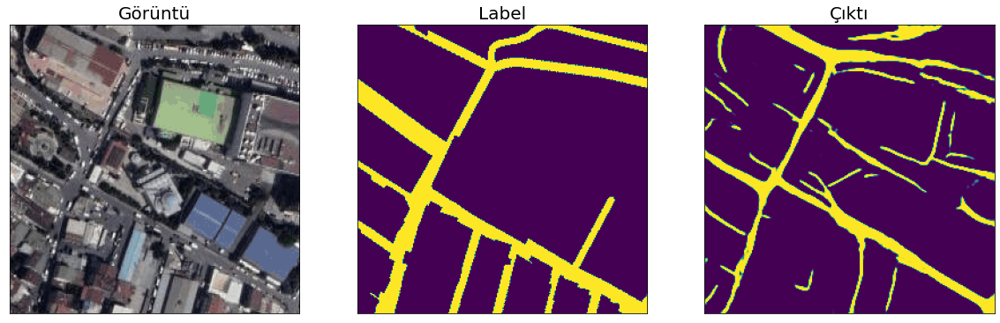

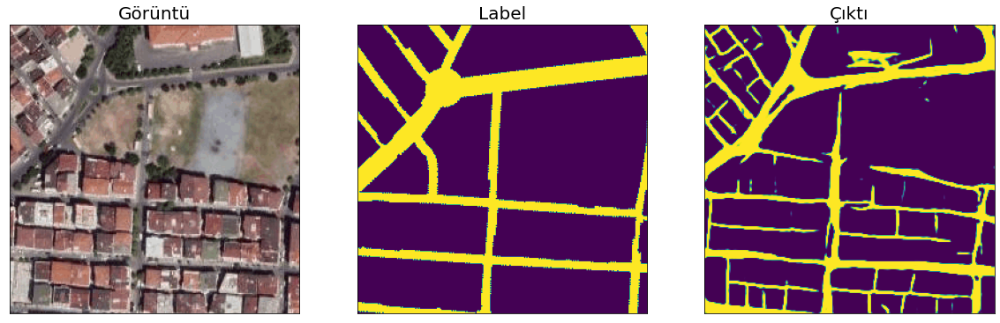

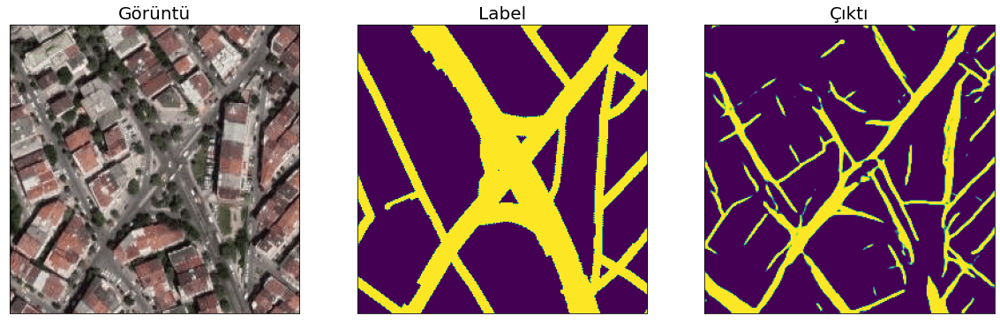

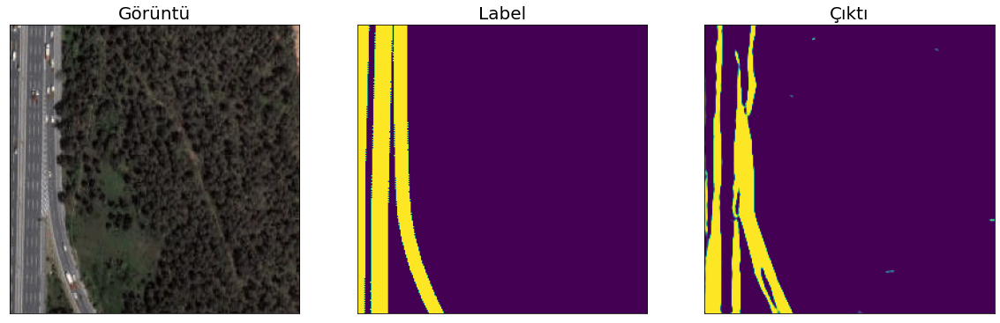

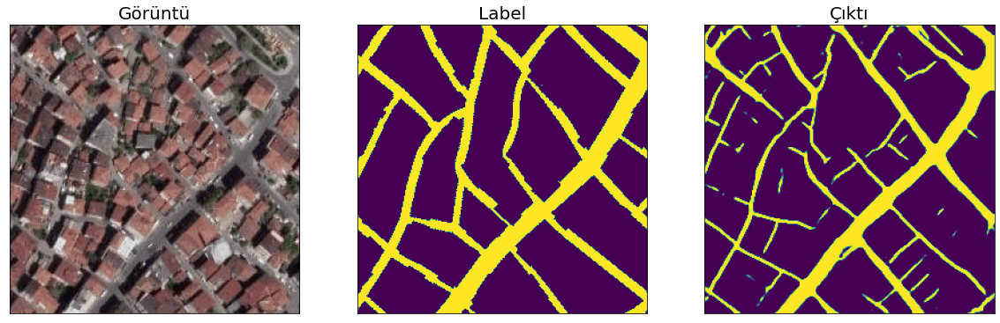

...

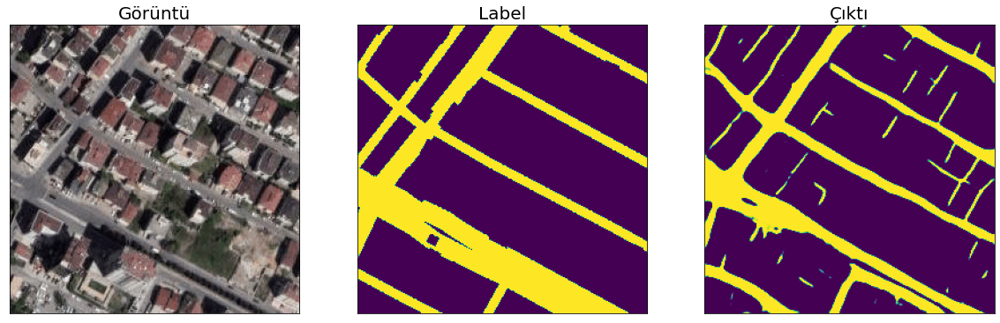

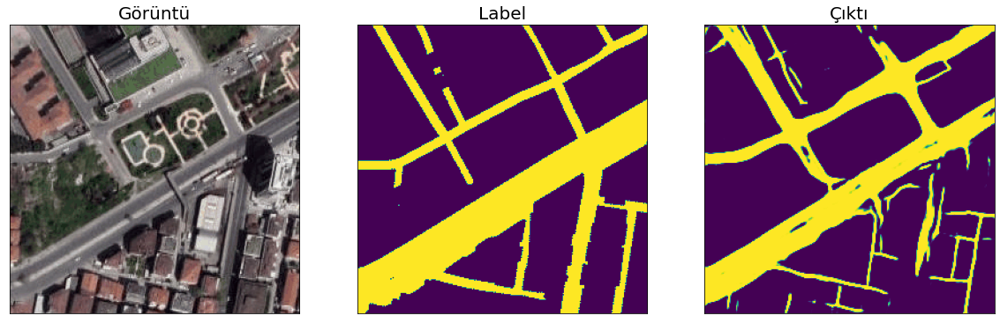

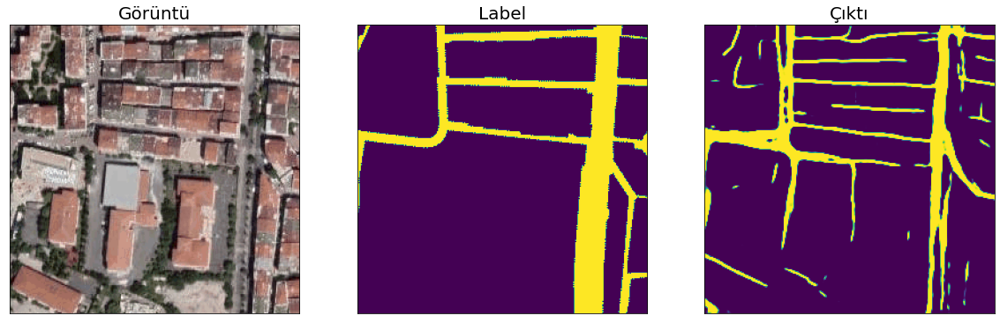

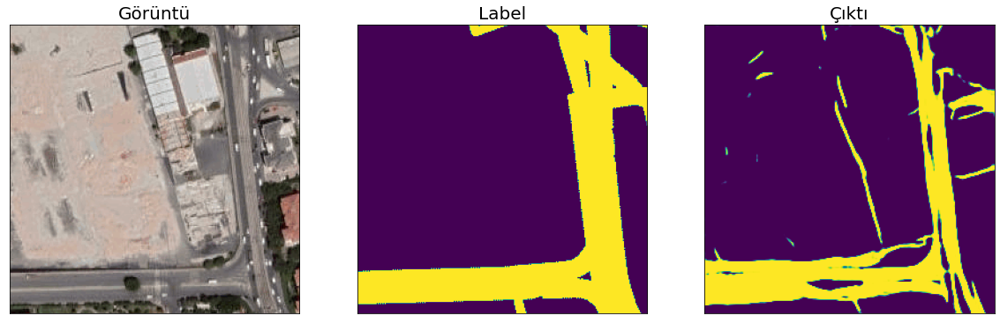

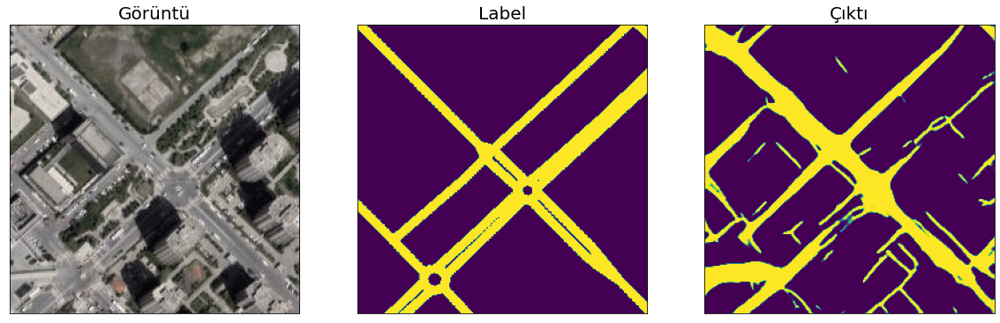

In [86]:

def visualize(**images):
    
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()




for i in range(len(test_dataset)):
    
    
    image, gt_mask = test_dataset[i]
    
    gt_mask = gt_mask.squeeze()
    
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = pr_mask.squeeze().cpu()
    img=cv2.imread(test_image[i])
    img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    msk = cv2.imread(test_label[i], cv2.IMREAD_GRAYSCALE) / 255.0
    visualize(Görüntü = img,label=msk,Çıktı=pr_mask)

    i+=1
    
    
    